In [81]:
from wrangle import wrangle_wine
import seaborn as sns
import matplotlib.pyplot as plt

#standard ds
import pandas as pd
import numpy as np

#viz and stats
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats

from sklearn.cluster import KMeans
# the thing that will do the scaling:
from sklearn.preprocessing import MinMaxScaler

In [2]:
train, val, test = wrangle_wine()

In [3]:
train.shape, val.shape, test.shape

((3637, 13), (1560, 13), (1300, 13))

In [4]:
train.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,color
2391,6.4,0.460,0.08,4.90,0.046,34.0,144.0,0.99445,3.10,0.56,10.0,5,white
989,9.7,0.295,0.40,1.50,0.073,14.0,21.0,0.99556,3.14,0.51,10.9,6,red
2805,7.0,0.260,0.46,15.55,0.037,61.0,171.0,0.99860,2.94,0.35,8.8,6,white
2909,5.2,0.365,0.08,13.50,0.041,37.0,142.0,0.99700,3.46,0.39,9.9,6,white
41,8.8,0.610,0.30,2.80,0.088,17.0,46.0,0.99760,3.26,0.51,9.3,4,red


## Q1 What is the distribution of each varible?

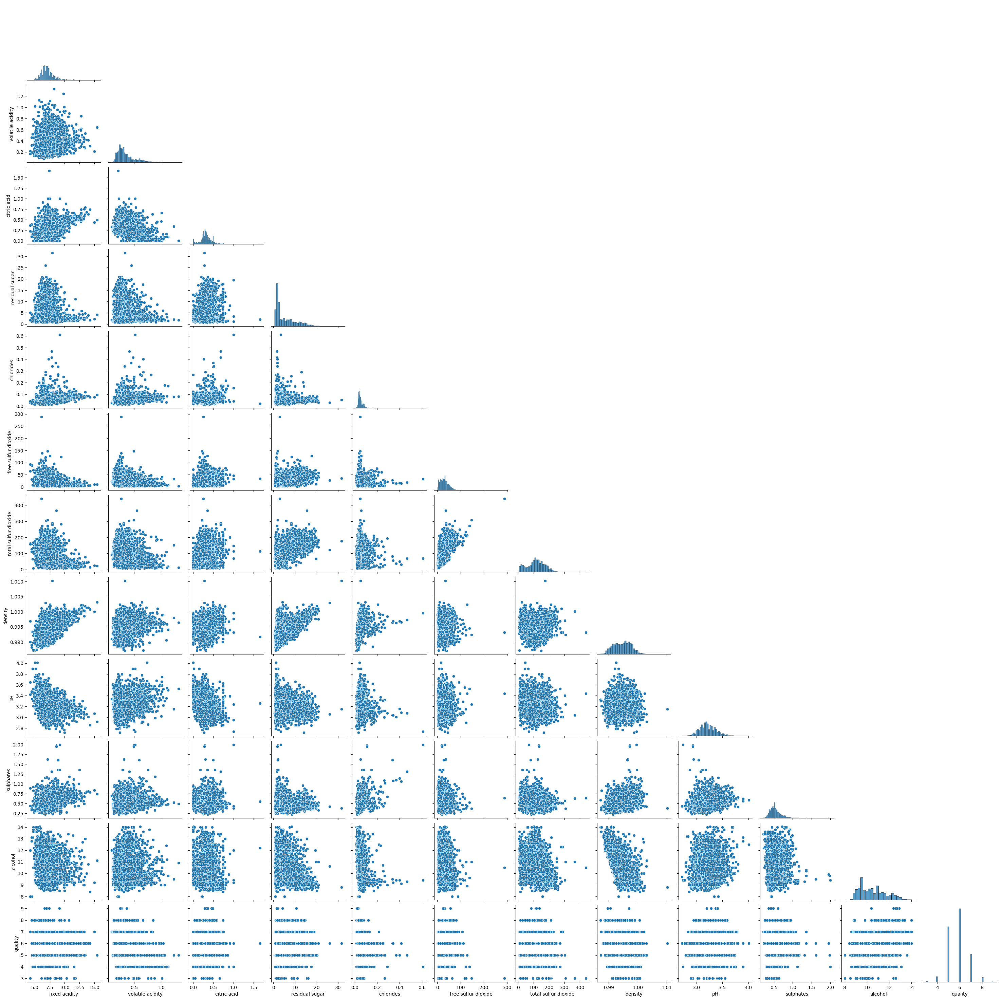

In [5]:
sns.pairplot(data=train, corner=True)
plt.show()

In [159]:
a = 0.05

In [39]:

train.quality.value_counts(), val.quality.value_counts(), test.quality.value_counts()

(6    1587
 5    1198
 7     604
 4     119
 8     104
 3      20
 9       5
 Name: quality, dtype: int64,
 6    675
 5    523
 7    258
 4     53
 8     46
 3      5
 Name: quality, dtype: int64,
 6    574
 5    417
 7    217
 4     44
 8     43
 3      5
 Name: quality, dtype: int64)

## Q2 what is the relation between density and volatile acidity 

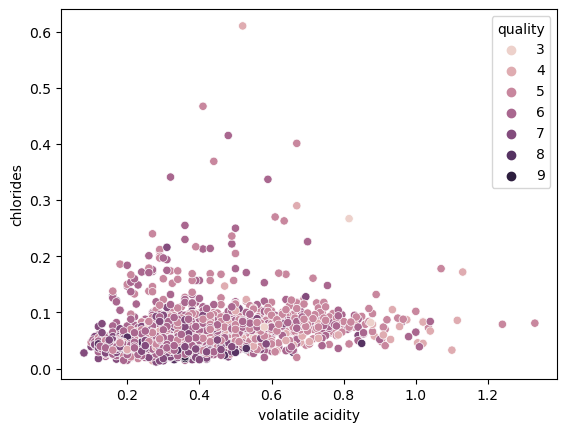

In [167]:
sns.scatterplot(x=train['volatile acidity'], y=train.chlorides, hue=train.quality)
plt.show()

#### H$o$: There is no correlation between density and fixed acidity 
#### H$a$: There is correlation between density and fixed acidity 

In [168]:
corr, p_value = stats.pearsonr(train.density, train['volatile acidity'])
corr, p_value

(0.2670529800568768, 1.9608420231120405e-60)

### Q3 What is the relationship between alcohol and density

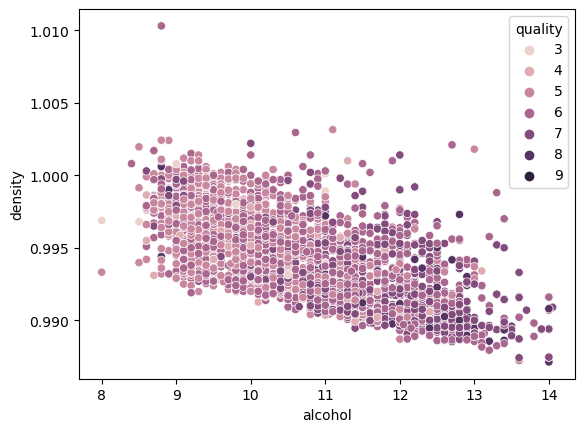

In [154]:
sns.scatterplot(x=train['alcohol'], y=train['density'], hue=train.quality)
plt.show()

#### H$o$: There is no correlation between density and alcolhol 
#### H$a$: There is correlation between density and alcolhol

In [156]:
corr, p_value = stats.pearsonr(train.density, train.alcohol)
corr, p_value

(-0.7022811865547577, 0.0)

In [161]:
if p_value < a:
    print('We can reject the null hypothesis')
else:
    print('We fail to reject the null hypothesis')

We can reject the null hypothesis


## Q 4 what is the correlation between volatile acidity and chlorides

#### H$o$: There is no correlation between volatile acidity and chlorides 
#### H$a$: There is correlation between volatile acidity and chlorides

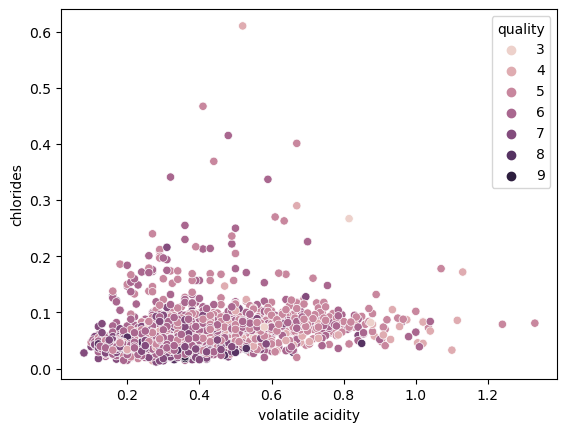

In [20]:
sns.scatterplot(x=train['volatile acidity'], y=train['chlorides'], hue=train.quality)
plt.show()

In [163]:
corr, p_value = stats.pearsonr(train['volatile acidity'], train.chlorides)
corr, p_value

if p_value < a:
    print('We can reject the null hypothesis')
else:
    print('We fail to reject the null hypothesis')

We can reject the null hypothesis


In [72]:
conditions = [
    (train.quality == 3) | (train.quality == 4) | (train.quality == 5),
    (train.quality == 6), 
    (train.quality == 7) | (train.quality == 8) | (train.quality == 9)
]


values = ['low', 'medium', 'high']

train['quality_bins'] = np.select(conditions, values, default=np.nan)

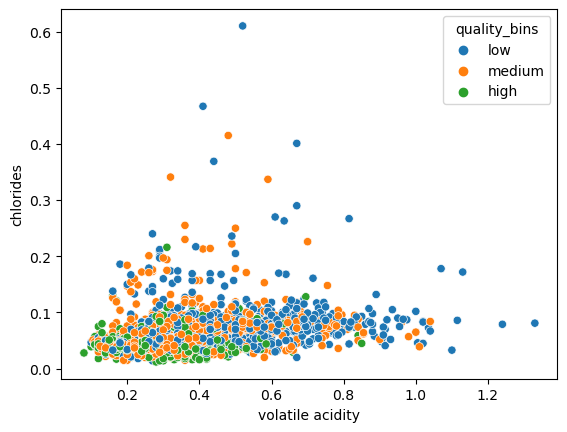

In [73]:
sns.scatterplot(x=train['volatile acidity'], y=train['chlorides'], hue=train.quality_bins)
plt.show()

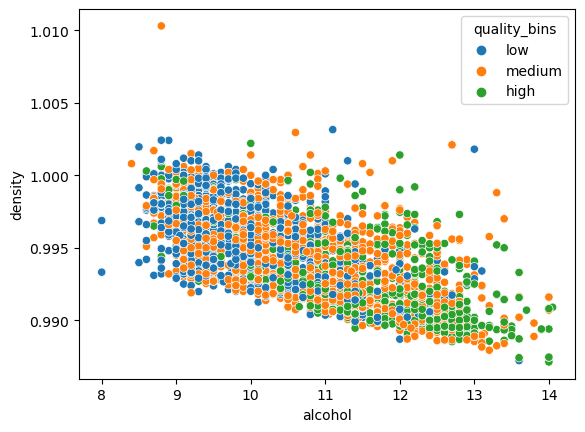

In [74]:
sns.scatterplot(x=train.alcohol, y=train.density, hue=train.quality_bins )
plt.show()

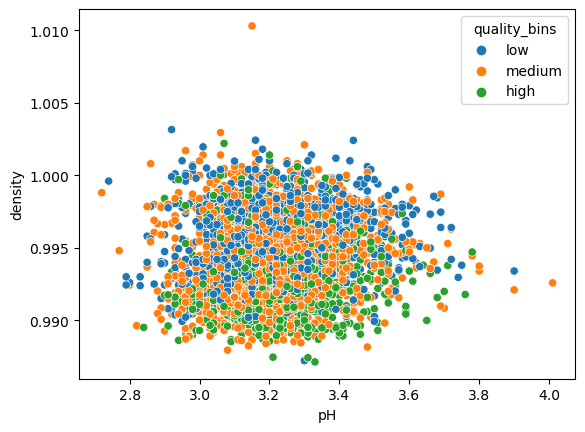

In [75]:
sns.scatterplot(x=train.pH, y=train.density, hue=train.quality_bins)
plt.show()

In [24]:
train.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality', 'color', 'quality_bins'],
      dtype='object')

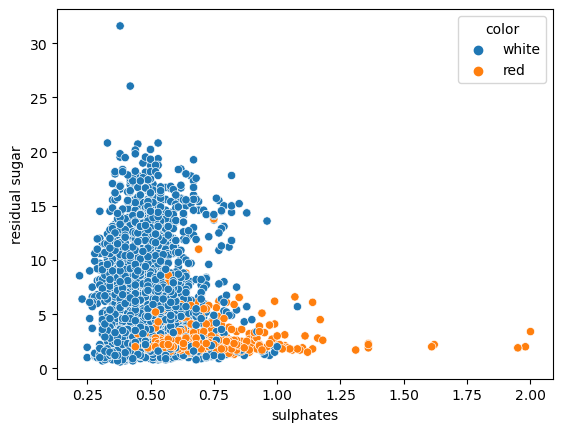

In [30]:
sns.scatterplot(x=train.sulphates, y=train['residual sugar'], hue=train.color)
plt.show()

In [33]:
x_cols = ['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol']

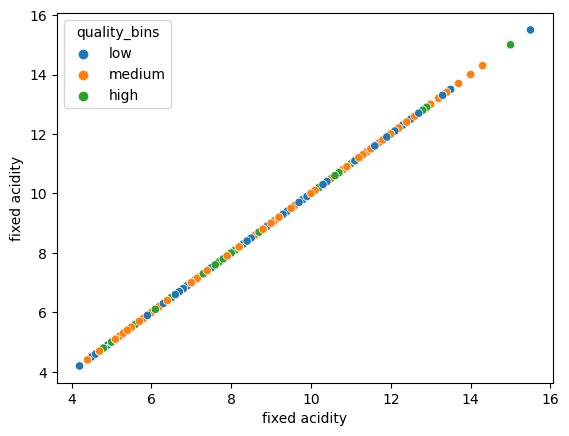

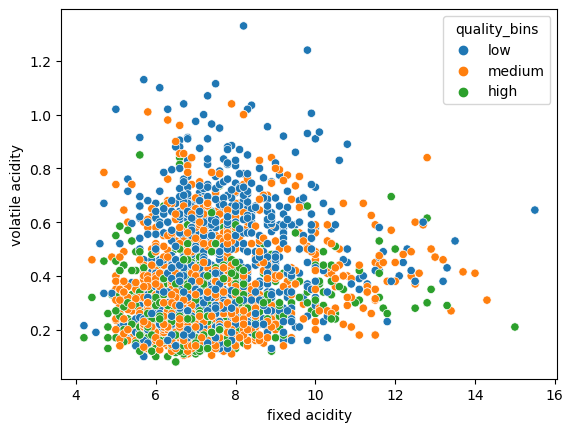

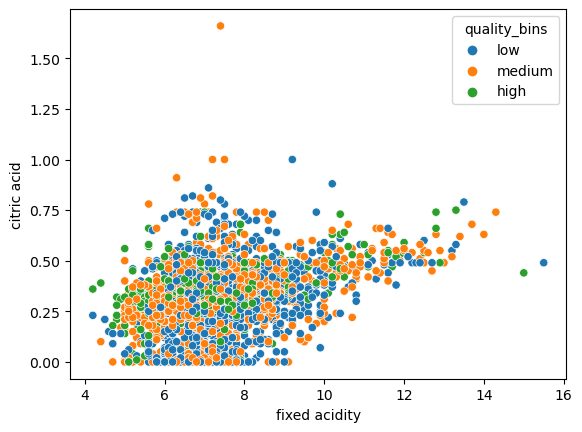

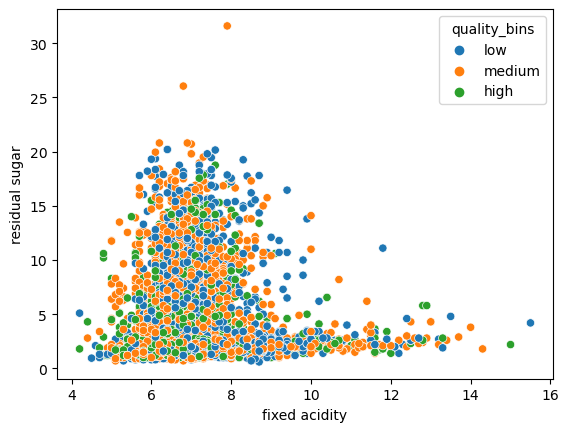

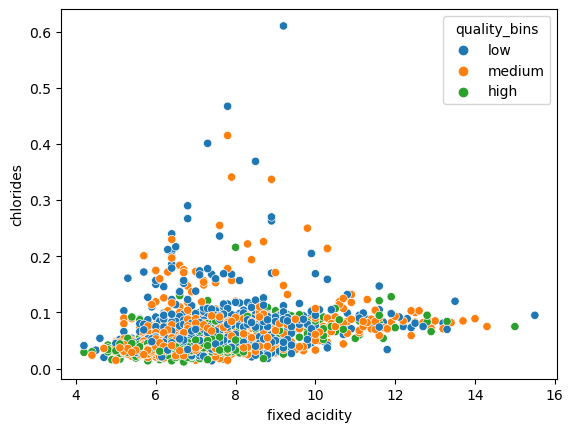

...

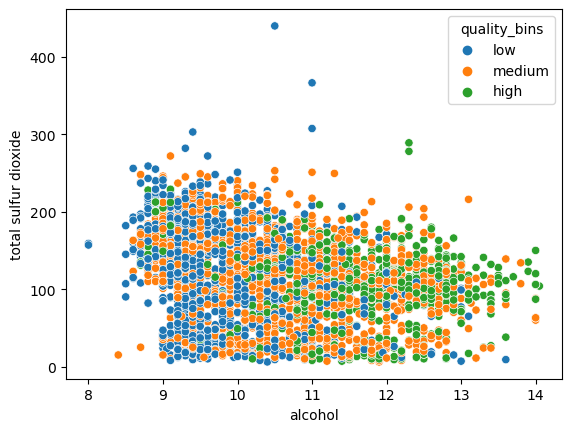

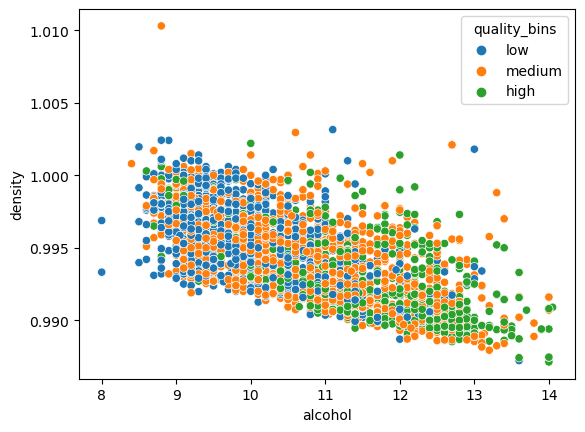

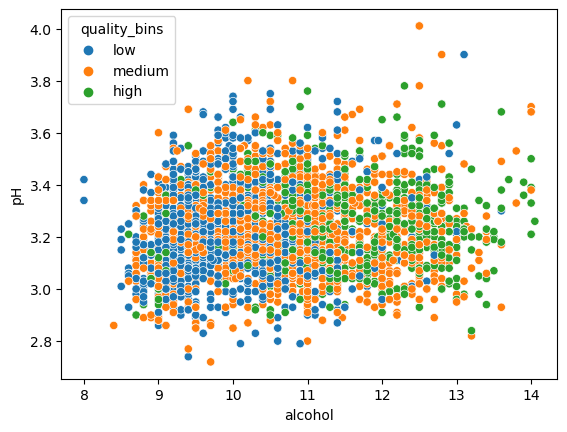

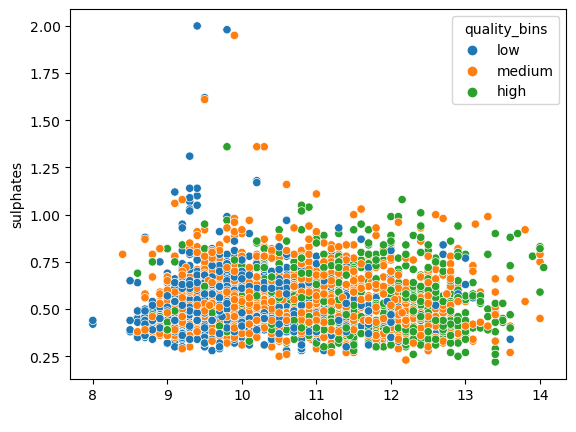

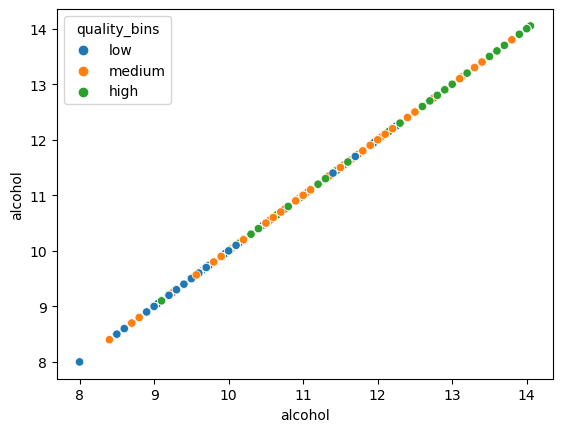

In [80]:
for col in x_col:
    for scol in x_col:
        sns.scatterplot(x=train[col], y=train[scol], hue=train.quality_bins)
        plt.show()
        

takaways
- possible clustering
    - alcohol clorides 
    - alcohol sulfates


In [40]:
train.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality', 'color', 'quality_bins'],
      dtype='object')

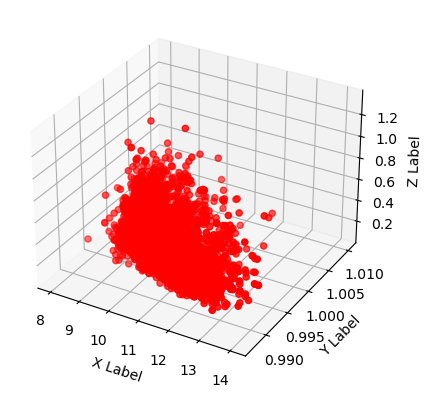

In [78]:
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d

fig = plt.figure()
ax = plt.axes(projection='3d')

# Create data points
x = train['alcohol']
y = train['density']
z = train['volatile acidity']

# Create scatter plot
ax.scatter(x, y, z, c='r', marker='o')

# Set axis labels
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

# Show the plot
plt.show()


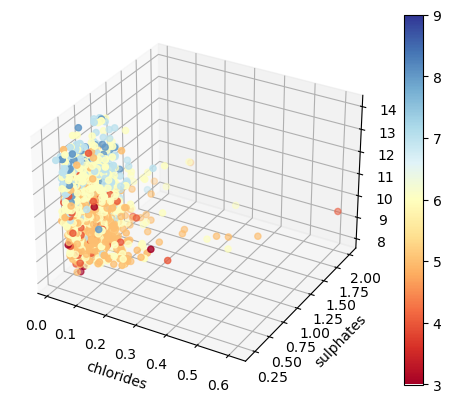

In [69]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d

fig = plt.figure()
ax = plt.axes(projection='3d')

# Create data points
z = train['alcohol']
x = train['chlorides']
y = train['sulphates']
# Create variable for hue
hue = train['quality']

# Create colormap
cmap = plt.cm.get_cmap('RdYlBu')

# Create scatter plot with hue based on variable
scatter = ax.scatter(x, y, z, c=hue, cmap=cmap, marker='o')

# Set colorbar
plt.colorbar(scatter)

# Set axis labels
ax.set_zlabel('alcohol')
ax.set_xlabel('chlorides')
ax.set_ylabel('sulphates')

# Show the plot
plt.show()


In [52]:
train.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality', 'color', 'quality_bins'],
      dtype='object')

### Modeling for clusters

In [83]:
train.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,color,quality_bins
2391,6.4,0.460,0.08,4.90,0.046,34.0,144.0,0.99445,3.10,0.56,10.0,5,white,low
989,9.7,0.295,0.40,1.50,0.073,14.0,21.0,0.99556,3.14,0.51,10.9,6,red,medium
2805,7.0,0.260,0.46,15.55,0.037,61.0,171.0,0.99860,2.94,0.35,8.8,6,white,medium
2909,5.2,0.365,0.08,13.50,0.041,37.0,142.0,0.99700,3.46,0.39,9.9,6,white,medium
41,8.8,0.610,0.30,2.80,0.088,17.0,46.0,0.99760,3.26,0.51,9.3,4,red,low


In [84]:
x_cols

['fixed acidity',
 'volatile acidity',
 'citric acid',
 'residual sugar',
 'chlorides',
 'free sulfur dioxide',
 'total sulfur dioxide',
 'density',
 'pH',
 'sulphates',
 'alcohol']

In [87]:
train_scaled = train.copy()

In [89]:
train_scaled[x_cols] = MinMaxScaler(
).fit_transform(train_scaled[x_cols])

In [90]:
train_scaled.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,color,quality_bins
2391,0.194690,0.304,0.048193,0.138710,0.056856,0.114583,0.317972,0.315926,0.294574,0.191011,0.330579,5,white,low
989,0.486726,0.172,0.240964,0.029032,0.102007,0.045139,0.034562,0.363833,0.325581,0.162921,0.479339,6,red,medium
2805,0.247788,0.144,0.277108,0.482258,0.041806,0.208333,0.380184,0.495037,0.170543,0.073034,0.132231,6,white,medium
2909,0.088496,0.228,0.048193,0.416129,0.048495,0.125000,0.313364,0.425982,0.573643,0.095506,0.314050,6,white,medium
41,0.407080,0.424,0.180723,0.070968,0.127090,0.055556,0.092166,0.451877,0.418605,0.162921,0.214876,4,red,low


In [137]:
cols_scaled

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality'],
      dtype='object')

In [147]:
cols_scaled = train_scaled.drop(columns=['color', 'quality_bins', 'quality', 'clusters']).columns

In [148]:
cols_scaled

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol'],
      dtype='object')

In [149]:
k_means_prototype = KMeans(n_clusters=3)
# fit the thing!!!!
k_means_prototype.fit(train_scaled[cols_scaled])
# use the thing
clusters = k_means_prototype.predict(
    train[cols_scaled])

In [150]:
train_scaled['clusters'] = clusters

In [153]:
train_scaled['clusters'].value_counts()

1    3432
2     205
Name: clusters, dtype: int64

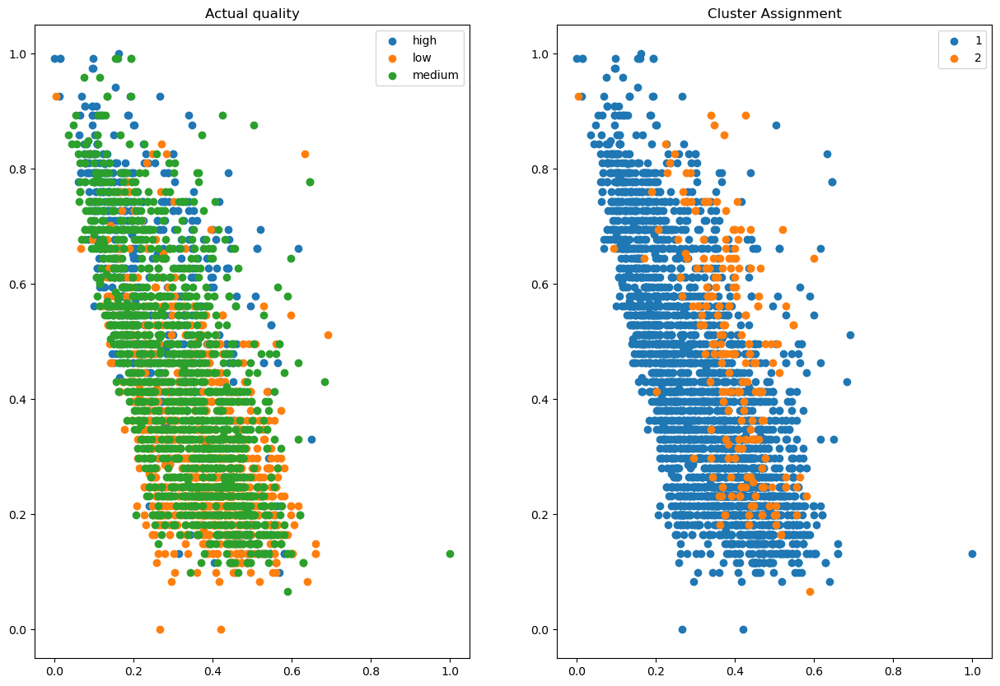

In [151]:
fig, axs = plt.subplots(1, 2, figsize=(15, 10))

for quality_bin, subset in train_scaled.groupby('quality_bins'):
    axs[0].scatter(subset.density,
                   subset.alcohol,
                   label=quality_bin)
axs[0].legend()
axs[0].set(title='Actual quality')

for cluster in train_scaled.clusters.unique():
    axs[1].scatter(train_scaled[train_scaled.clusters == cluster].density,
             train_scaled[train_scaled.clusters == cluster].alcohol,
               label=cluster)
axs[1].legend()
axs[1].set(title='Cluster Assignment')

plt.show()

In [141]:
x_cols

['fixed acidity',
 'volatile acidity',
 'citric acid',
 'residual sugar',
 'chlorides',
 'free sulfur dioxide',
 'total sulfur dioxide',
 'density',
 'pH',
 'sulphates',
 'alcohol']